In [ ]:
! pip install datasist==1.5.3

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
employee_data = pd.read_csv("/content/employee_attrition_dataset.csv")
employee_data.head(3)

,Employee ID,Age,Gender,Years at Company,Job Role,Monthly Income,Work-Life Balance,Job Satisfaction,Performance Rating,Number of Promotions,Overtime,Distance from Home,Education Level,Marital Status,Number of Dependents,Job Level,Remote Work,Employee Recognition,Attrition
0,8410,31,Male,19,Education,5390,Excellent,Medium,Average,2,0,22.0,Associate Degree,Married,0,Mid,No,Medium,Stayed
1,64756,59,Female,4,Media,5534,Poor,High,Low,3,0,21.0,Masterâ€™s Degree,Divorced,3,Mid,No,Low,Stayed
2,30257,24,Female,10,Healthcare,8159,good#,High,Low,0,0,11.0,Bachelorâ€™s Degree,Married,3,Mid,No,Low,Stayed


In [ ]:
employee_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Employee ID           50000 non-null  int64  
 1   Age                   50000 non-null  int64  
 2   Gender                50000 non-null  object 
 3   Years at Company      50000 non-null  int64  
 4   Job Role              50000 non-null  object 
 5   Monthly Income        50000 non-null  int64  
 6   Work-Life Balance     50000 non-null  object 
 7   Job Satisfaction      50000 non-null  object 
 8   Performance Rating    50000 non-null  object 
 9   Number of Promotions  50000 non-null  int64  
 10  Overtime              50000 non-null  object 
 11  Distance from Home    49015 non-null  float64
 12  Education Level       50000 non-null  object 
 13  Marital Status        50000 non-null  object 
 14  Number of Dependents  50000 non-null  int64  
 15  Job Level          

## data cleaning

In [ ]:
employee_data.columns = [col.lower().replace(' ', '_') for col in employee_data.columns]

In [ ]:
employee_data['employee_id'] = employee_data['employee_id'].astype(str)

In [ ]:
employee_data['monthly_income'] = employee_data['monthly_income'].astype(float)

In [ ]:
employee_data.duplicated().sum()

np.int64(0)

In [ ]:
employee_data["education_level"].value_counts()

,count
education_level,
Bachelorâ€™s Degree,14894
Associate Degree,12521
Masterâ€™s Degree,10138
High School,9861
PhD,2586


In [ ]:
employee_data["education_level"] = employee_data["education_level"].replace("Bachelorâ€™s Degree", "Bachelor's Degree")
employee_data["education_level"] = employee_data["education_level"].replace("Masterâ€™s Degree", "Master's Degree")
employee_data["education_level"] = employee_data["education_level"].replace("High School", "High school")
employee_data["education_level"] = employee_data["education_level"].replace("PhD", "PHD")

In [ ]:
employee_data["education_level"].value_counts()

,count
education_level,
Bachelor's Degree,14894
Associate Degree,12521
Master's Degree,10138
High school,9861
PHD,2586


In [ ]:
employee_data["work-life_balance"].value_counts()

,count
work-life_balance,
good#,18900
Fair,15187
Excellent,8990
Poor,6923


In [ ]:
employee_data["work-life_balance"] = employee_data["work-life_balance"].replace("good#", "good")

In [ ]:
employee_data["work-life_balance"].value_counts()

,count
work-life_balance,
good,18900
Fair,15187
Excellent,8990
Poor,6923


In [ ]:
employee_data["marital_status"].value_counts()

,count
marital_status,
Married,25105
single$,17476
Divorced,7419


In [ ]:
employee_data["marital_status"] = employee_data["marital_status"].replace("single$", "single")

In [ ]:
employee_data["marital_status"].value_counts()

,count
marital_status,
Married,25105
single,17476
Divorced,7419


In [ ]:
employee_data["overtime"].value_counts()

,count
overtime,
0,33813
Yes,16187


In [ ]:
employee_data["overtime"] = employee_data["overtime"].replace("0", "No")

In [ ]:
employee_data["overtime"].value_counts()

,count
overtime,
No,33813
Yes,16187


## handle missing data

In [ ]:
employee_data.isnull().sum()

,0
employee_id,0
age,0
gender,0
years_at_company,0
job_role,0
monthly_income,0
work-life_balance,0
job_satisfaction,0
performance_rating,0
number_of_promotions,0


In [ ]:
employee_data.dropna(inplace=True)

## feature engineering

In [ ]:
def income_category(income):
    if income < 5000:
        return 'Low'
    elif income < 10000:
        return 'Medium'
    else:
        return 'High'
employee_data['income_category'] = employee_data['monthly_income'].apply(income_category)

In [ ]:
employee_data['hiring_year'] = 2025 - employee_data['years_at_company']
employee_data['hiring_year'] = employee_data['hiring_year'].astype(str)

In [ ]:
employee_data.head(2)

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,...,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,attrition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,Excellent,Medium,Average,2,...,22.0,Associate Degree,Married,0,Mid,No,Medium,Stayed,Medium,2006
1,64756,59,Female,4,Media,5534.0,Poor,High,Low,3,...,21.0,Master's Degree,Divorced,3,Mid,No,Low,Stayed,Medium,2021


In [ ]:
employee_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49015 entries, 0 to 49999
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           49015 non-null  object 
 1   age                   49015 non-null  int64  
 2   gender                49015 non-null  object 
 3   years_at_company      49015 non-null  int64  
 4   job_role              49015 non-null  object 
 5   monthly_income        49015 non-null  float64
 6   work-life_balance     49015 non-null  object 
 7   job_satisfaction      49015 non-null  object 
 8   performance_rating    49015 non-null  object 
 9   number_of_promotions  49015 non-null  int64  
 10  overtime              49015 non-null  object 
 11  distance_from_home    49015 non-null  float64
 12  education_level       49015 non-null  object 
 13  marital_status        49015 non-null  object 
 14  number_of_dependents  49015 non-null  int64  
 15  job_level             49

In [ ]:
employee_data.to_csv('employee_attrition_cleaned.csv', index=False)

## data analysis

In [ ]:
employee_data.describe()

,age,years_at_company,monthly_income,number_of_promotions,distance_from_home,number_of_dependents
count,49015.000000,49015.000000,49015.000000,49015.000000,49015.000000,49015.000000
mean,38.546180,15.746894,7332.264572,0.831847,49.947689,1.654596
std,12.069917,11.239476,2505.728701,0.994887,28.500870,1.584885
min,18.000000,1.000000,1516.000000,0.000000,1.000000,0.000000
25%,28.000000,7.000000,5654.000000,0.000000,25.000000,0.000000
50%,39.000000,13.000000,7338.000000,1.000000,50.000000,1.000000
75%,49.000000,23.000000,8870.000000,2.000000,75.000000,3.000000
max,59.000000,51.000000,50020.000000,4.000000,99.000000,15.000000


In [ ]:
employee_data.describe(include='object')

,employee_id,gender,job_role,work-life_balance,job_satisfaction,performance_rating,overtime,education_level,marital_status,job_level,remote_work,employee_recognition,attrition,income_category,hiring_year
count,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015
unique,49015,2,5,4,4,4,2,5,3,3,2,4,2,3,51
top,62518,Male,Technology,good,High,Average,No,Bachelor's Degree,Married,Entry,No,Low,Stayed,Medium,2020
freq,1,26871,12729,18521,24462,29472,33144,14584,24810,19573,39707,19591,25743,35678,2018


## numerical data

### monthly_income

In [ ]:
#monthly_income description based on attrition
employee_data.groupby('attrition')['monthly_income'].describe().round()

,count,mean,std,min,25%,50%,75%,max
attrition,,,,,,,,
Left,23272.0,7300.0,2509.0,1516.0,5616.0,7299.0,8851.0,50020.0
Stayed,25743.0,7362.0,2503.0,1575.0,5686.0,7369.0,8888.0,50020.0


In [ ]:
#monthly_income distribution based on attrition
fig = px.histogram(employee_data, x='monthly_income', color='attrition', barmode='group', nbins=10 ,color_discrete_sequence=px.colors.qualitative.Vivid )
fig

Lower monthly income generally increases the likelihood of attrition.

<Axes: xlabel='attrition', ylabel='monthly_income'>

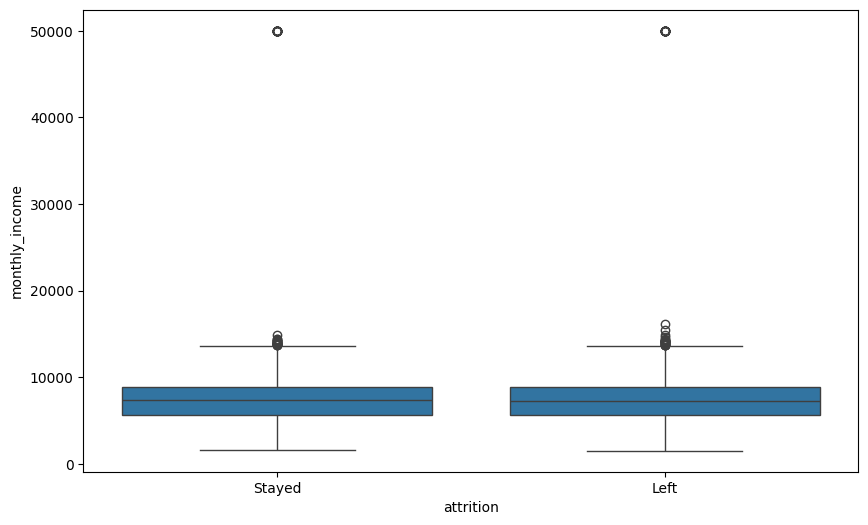

In [ ]:
#monthly_income distribution based on attrition
plt.figure(figsize=(10, 6))
sns.boxplot(x='attrition', y='monthly_income', data=employee_data)

### years_at_company

In [ ]:
#years_at_company description based on attrition
employee_data.groupby('attrition')['years_at_company'].describe().round()

,count,mean,std,min,25%,50%,75%,max
attrition,,,,,,,,
Left,23272.0,15.0,11.0,1.0,6.0,12.0,22.0,51.0
Stayed,25743.0,16.0,11.0,1.0,7.0,14.0,24.0,51.0


In [ ]:
#years_at_company distribution based on attrition
fig = px.histogram(employee_data, x='years_at_company', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig

Fewer years at the company generally increases the likelihood of attrition. Newer employees may be still evaluating their fit with the company, exploring other options.

<Axes: xlabel='attrition', ylabel='years_at_company'>

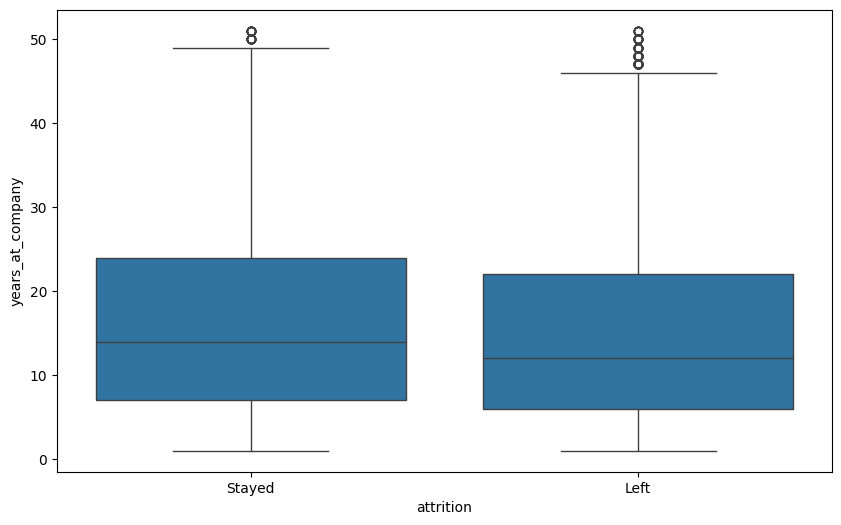

In [ ]:
#years_at_company distribution based on attrition
plt.figure(figsize=(10, 6))
sns.boxplot(x='attrition', y='years_at_company', data=employee_data)

### distance_from_home

In [ ]:
#distance_from_home description based on attrition
employee_data.groupby('attrition')['distance_from_home'].describe().round()

,count,mean,std,min,25%,50%,75%,max
attrition,,,,,,,,
Left,23272.0,53.0,28.0,1.0,29.0,55.0,77.0,99.0
Stayed,25743.0,47.0,28.0,1.0,23.0,45.0,72.0,99.0


In [ ]:
#distance_from_home distribution based on attrition
fig = px.histogram(employee_data, x='distance_from_home', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Vivid)
fig

A greater distance from home (longer commute) generally increases the likelihood of attrition.

<Axes: xlabel='attrition', ylabel='distance_from_home'>

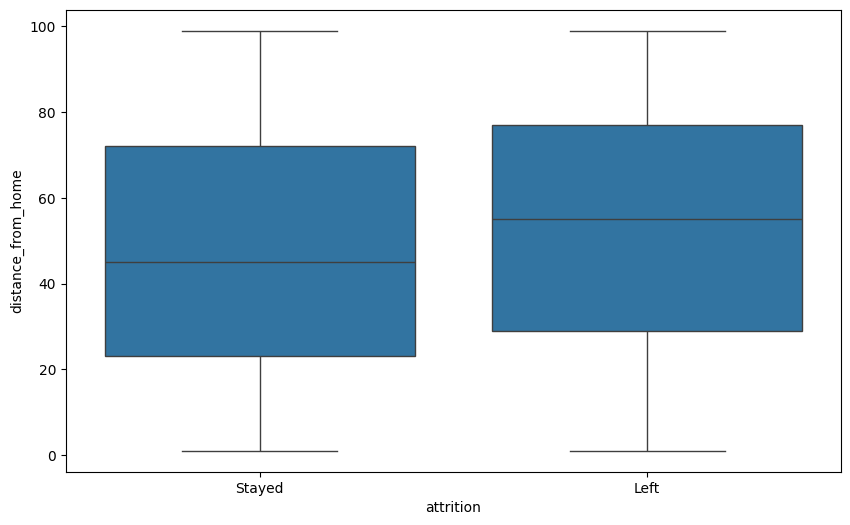

In [ ]:
#distance_from_home distribution based on attrition use seaborn
plt.figure(figsize=(10, 6))
sns.boxplot(x='attrition', y='distance_from_home', data=employee_data)

### number_of_dependents

In [ ]:
#number_of_dependents description based on attrition
employee_data.groupby('attrition')['number_of_dependents'].describe().round()

,count,mean,std,min,25%,50%,75%,max
attrition,,,,,,,,
Left,23272.0,2.0,1.0,0.0,0.0,1.0,3.0,15.0
Stayed,25743.0,2.0,2.0,0.0,0.0,1.0,3.0,15.0


In [ ]:
# number_of_dependents distribution based on attrition
fig = px.histogram(employee_data, x='number_of_dependents', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig

The number of dependents may not have a strong or clear effect on attrition in this dataset.

<Axes: xlabel='attrition', ylabel='number_of_dependents'>

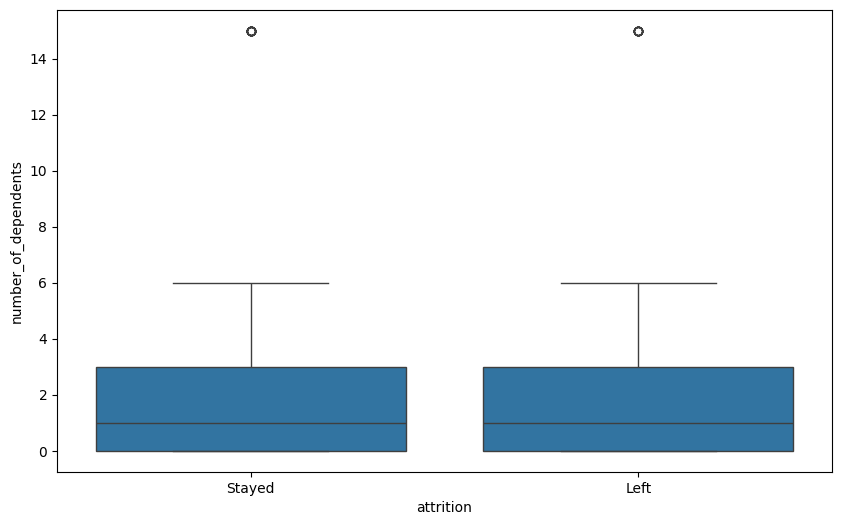

In [ ]:
# number_of_dependents distribution based on attrition use seaborn
plt.figure(figsize=(10, 6))
sns.boxplot(x='attrition', y='number_of_dependents', data=employee_data)

### age

In [ ]:
#age description based on attrition
employee_data.groupby('attrition')['age'].describe().round()

,count,mean,std,min,25%,50%,75%,max
attrition,,,,,,,,
Left,23272.0,38.0,12.0,18.0,27.0,38.0,48.0,59.0
Stayed,25743.0,39.0,12.0,18.0,29.0,39.0,49.0,59.0


In [ ]:
#age distribution based on attrition
fig = px.histogram(employee_data, x='age', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Vivid)
fig


Younger age generally increases the likelihood of attrition. Younger employees are often earlier in their careers, may be more mobile, and actively seeking diverse experiences.

<Axes: xlabel='attrition', ylabel='age'>

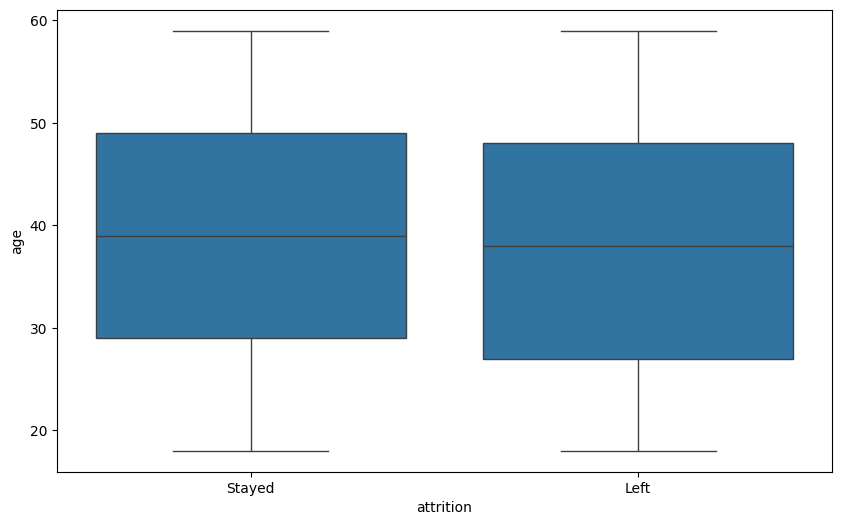

In [ ]:
#age distribution based on attrition
plt.figure(figsize=(10, 6))
sns.boxplot(x='attrition', y='age', data=employee_data)

### number_of_promotions

In [ ]:
#number_of_promotions description based on attrition
employee_data.groupby('attrition')['number_of_promotions'].describe().round()

,count,mean,std,min,25%,50%,75%,max
attrition,,,,,,,,
Left,23272.0,1.0,1.0,0.0,0.0,0.0,1.0,4.0
Stayed,25743.0,1.0,1.0,0.0,0.0,1.0,2.0,4.0


In [ ]:
#number_of_promotions distribution based on attrition
fig = px.histogram(employee_data, x='number_of_promotions', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig

A lower number of promotions generally increases the likelihood of attrition. A lack of career advancement opportunities can lead to frustration

<Axes: xlabel='attrition', ylabel='number_of_promotions'>

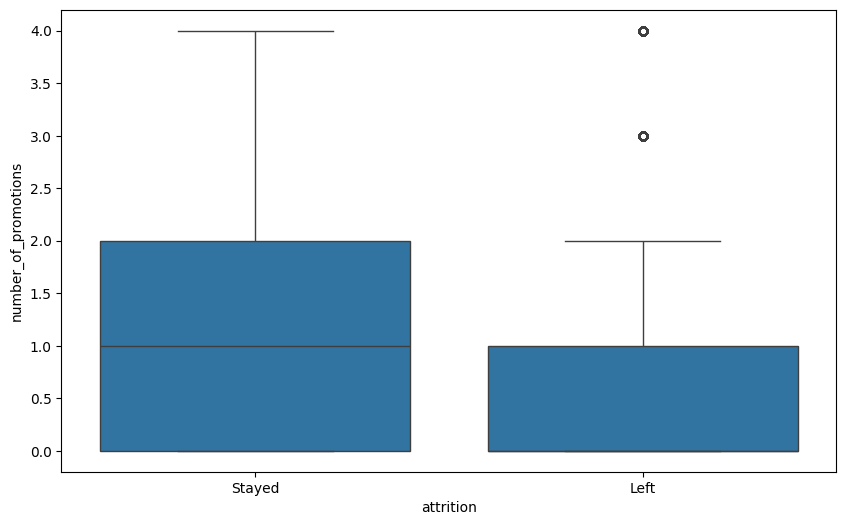

In [ ]:
#number_of_promotions distribution based on attrition
plt.figure(figsize=(10, 6))
sns.boxplot(x='attrition', y='number_of_promotions', data=employee_data)

## categorical data

In [ ]:
employee_data.describe(include='object')

,employee_id,gender,job_role,work-life_balance,job_satisfaction,performance_rating,overtime,education_level,marital_status,job_level,remote_work,employee_recognition,attrition,income_category,hiring_year
count,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015,49015
unique,49015,2,5,4,4,4,2,5,3,3,2,4,2,3,51
top,62518,Male,Technology,good,High,Average,No,Bachelor's Degree,Married,Entry,No,Low,Stayed,Medium,2020
freq,1,26871,12729,18521,24462,29472,33144,14584,24810,19573,39707,19591,25743,35678,2018


### attrition

In [ ]:
#attrition numbers
employee_data['attrition'].value_counts()

,count
attrition,
Stayed,25743
Left,23272


In [ ]:
#attrition
fig = px.pie(employee_data, names='attrition', color_discrete_sequence=px.colors.qualitative.Antique)
fig

### gender

In [ ]:
#gender numbers
employee_data['gender'].value_counts()

,count
gender,
Male,26871
Female,22144


In [ ]:
#gender numbers based on attrition
employee_data.groupby('attrition')['gender'].value_counts()

attrition  gender
Left       Female    11744
           Male      11528
Stayed     Male      15343
           Female    10400
Name: count, dtype: int64

In [ ]:
#gender
fig = px.pie(employee_data, names='gender', color_discrete_sequence=px.colors.qualitative.Vivid)
fig

In [ ]:
#gender based on attrition
fig = px.histogram(employee_data, x='gender', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig



Based on the typical findings, gender may not have a strong or significant effect on attrition in this dataset.

### job_role

In [ ]:
#job_role numbers
employee_data['job_role'].value_counts()

,count
job_role,
Technology,12729
Healthcare,11208
Education,10300
Media,7896
Finance,6882


In [ ]:
#job_role numbers based on attrition
employee_data.groupby('attrition')['job_role'].value_counts()

attrition  job_role  
Left       Technology    5965
           Healthcare    5311
           Education     5014
           Media         3760
           Finance       3222
Stayed     Technology    6764
           Healthcare    5897
           Education     5286
           Media         4136
           Finance       3660
Name: count, dtype: int64

In [ ]:
#job_role based on attrition
fig = px.pie(employee_data, names='job_role', color_discrete_sequence=px.colors.qualitative.Vivid)
fig

<Axes: xlabel='job_role', ylabel='count'>

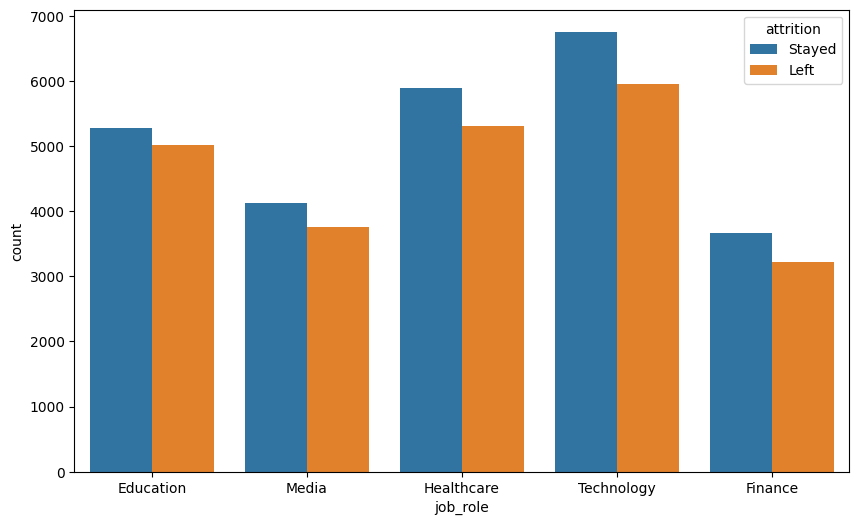

In [ ]:
#job_role based on attrition
plt.figure(figsize=(10, 6))
sns.countplot(x='job_role', hue='attrition', data=employee_data)

Certain job roles can have a significant effect on attrition.like in technology and healthcare

### work-life_balance

In [ ]:
#work-life_balance numbers
employee_data['work-life_balance'].value_counts()

,count
work-life_balance,
good,18521
Fair,14890
Excellent,8831
Poor,6773


In [ ]:
#work-life_balance numbers based on attrition
employee_data.groupby('attrition')['work-life_balance'].value_counts()

attrition  work-life_balance
Left       Fair                  8563
           good                  7465
           Poor                  4070
           Excellent             3174
Stayed     good                 11056
           Fair                  6327
           Excellent             5657
           Poor                  2703
Name: count, dtype: int64

In [ ]:
#work-life_balance based on attrition
fig = px.pie(employee_data, names='work-life_balance', color_discrete_sequence=px.colors.qualitative.Bold)
fig

<Axes: xlabel='work-life_balance', ylabel='count'>

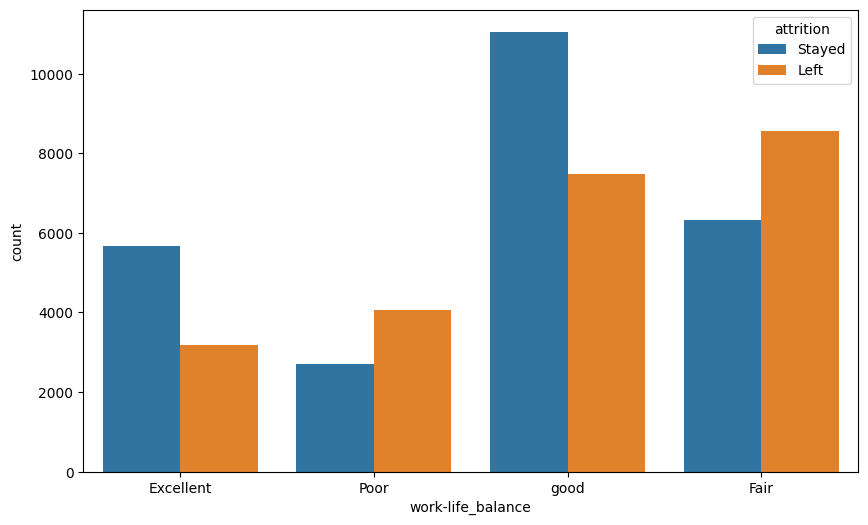

In [ ]:
#work-life_balance based on attrition
plt.figure(figsize=(10, 6))
sns.countplot(x='work-life_balance', hue='attrition', data=employee_data)

Poor and fair work-life balance significantly increases the likelihood of attrition.

### education_level

In [ ]:
#education_level numbers
employee_data['education_level'].value_counts()

,count
education_level,
Bachelor's Degree,14584
Associate Degree,12277
Master's Degree,9970
High school,9653
PHD,2531


In [ ]:
#education_level numbers based on attrition
employee_data.groupby('attrition')['education_level'].value_counts()

attrition  education_level  
Left       Bachelor's Degree    7190
           Associate Degree     5895
           Master's Degree      4888
           High school          4655
           PHD                   644
Stayed     Bachelor's Degree    7394
           Associate Degree     6382
           Master's Degree      5082
           High school          4998
           PHD                  1887
Name: count, dtype: int64

In [ ]:
#education_level based on attrition
fig = px.pie(employee_data, names='education_level', color_discrete_sequence=px.colors.qualitative.Dark2)
fig

In [ ]:
#education_level based on attrition
fig = px.histogram(employee_data, x='education_level', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig


Different education levels can have varying effects on attrition. the peaple with Bachelor's Degree and associate degree are more likely to leave

### job_level

In [ ]:
#job_level numbers
employee_data['job_level'].value_counts()

,count
job_level,
Entry,19573
Mid,19566
Senior,9876


In [ ]:
#job_level numbers based on attrition
employee_data.groupby('attrition')['job_level'].value_counts()

attrition  job_level
Left       Entry        12402
           Mid           8880
           Senior        1990
Stayed     Mid          10686
           Senior        7886
           Entry         7171
Name: count, dtype: int64

In [ ]:
#job_level based on attrition
fig = px.pie(employee_data, names='job_level', color_discrete_sequence=px.colors.qualitative.Alphabet)
fig

<Axes: xlabel='job_level', ylabel='count'>

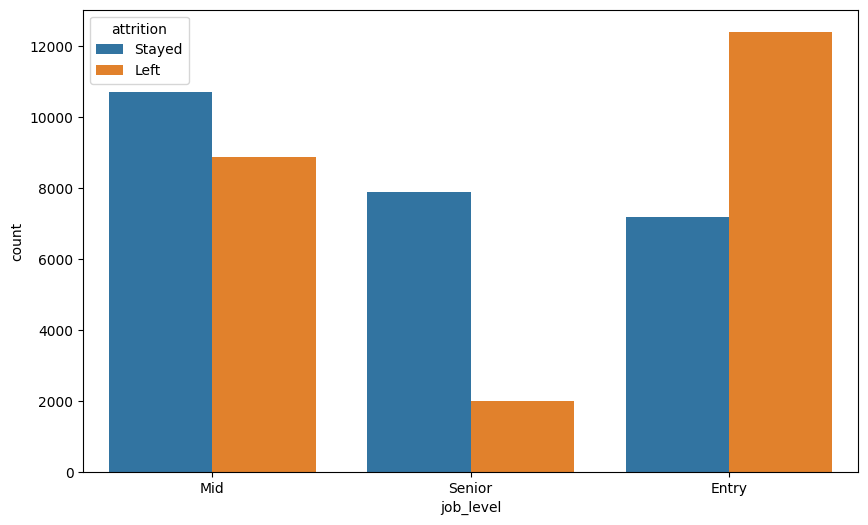

In [ ]:
#job_level based on attrition
plt.figure(figsize=(10, 6))
sns.countplot(x='job_level', hue='attrition', data=employee_data)

Lower job levels may increase the likelihood of attrition. Employees at entry or mid-levels might be more actively seeking promotions or higher-level roles elsewhere.

### job_satisfaction

In [ ]:
#job_satisfaction numbers
employee_data['job_satisfaction'].value_counts()

,count
job_satisfaction,
High,24462
Very High,9980
Medium,9755
Low,4818


In [ ]:
#job_satisfaction numbers based on attrition
employee_data.groupby('attrition')['job_satisfaction'].value_counts()

attrition  job_satisfaction
Left       High                11079
           Very High            5267
           Medium               4407
           Low                  2519
Stayed     High                13383
           Medium               5348
           Very High            4713
           Low                  2299
Name: count, dtype: int64

In [ ]:
#job_satisfaction based on attrition
fig = px.pie(employee_data, names='job_satisfaction', color_discrete_sequence=px.colors.qualitative.Bold)
fig

In [ ]:
#job_satisfaction based on attrition
fig = px.histogram(employee_data, x='job_satisfaction', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig


The effect of job_satisfaction rating on attrition can be complex and may not be a simple linear relationship. While low job_satisfaction expected to leave , high job_satisfaction might also leave for better opportunities.

### performance_rating

In [ ]:
#performance_rating numbers
employee_data['performance_rating'].value_counts()

,count
performance_rating,
Average,29472
High,9770
Below Average,7349
Low,2424


In [ ]:
#performance_rating numbers based on attrition
employee_data.groupby('attrition')['performance_rating'].value_counts()

attrition  performance_rating
Left       Average               13571
           High                   4463
           Below Average          3837
           Low                    1401
Stayed     Average               15901
           High                   5307
           Below Average          3512
           Low                    1023
Name: count, dtype: int64

In [ ]:
#performance_rating based on attrition
fig = px.pie(employee_data, names='performance_rating', color_discrete_sequence=px.colors.qualitative.Antique)
fig

<Axes: xlabel='performance_rating', ylabel='count'>

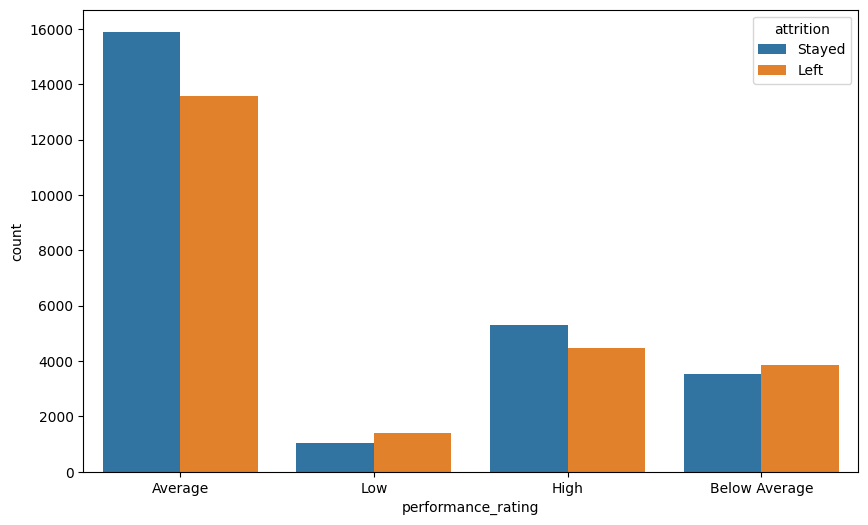

In [ ]:
#performance_rating based on attrition
plt.figure(figsize=(10, 6))
sns.countplot(x='performance_rating', hue='attrition', data=employee_data)

The effect of performance rating on attrition can be complex and may not be a simple linear relationship. While poor performers might be expected to leave or be managed out, high performers might also leave for better opportunities.

## overtime

In [ ]:
#overtime numbers
employee_data['overtime'].value_counts()

,count
overtime,
No,33144
Yes,15871


In [ ]:
#overtime numbers based on attrition
employee_data.groupby('attrition')['overtime'].value_counts()

attrition  overtime
Left       No          15106
           Yes          8166
Stayed     No          18038
           Yes          7705
Name: count, dtype: int64

In [ ]:
#overtime based on attrition
fig = px.pie(employee_data, names='overtime', color_discrete_sequence=px.colors.qualitative.Bold)
fig

In [ ]:
#overtime based on attrition
fig = px.histogram(employee_data, x='overtime', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig


Working overtime significantly increases the likelihood of attrition. Consistent overtime can lead to burnout.

### marital_status

In [ ]:
#marital_status numbers based on attrition
employee_data['marital_status'].value_counts()

,count
marital_status,
Married,24810
single,17193
Divorced,7012


In [ ]:
#marital_status numbers based on attrition
employee_data.groupby('attrition')['marital_status'].value_counts()

attrition  marital_status
Left       single            11471
           Married            8971
           Divorced           2830
Stayed     Married           15839
           single             5722
           Divorced           4182
Name: count, dtype: int64

In [ ]:
#marital_status based on attrition
fig = px.pie(employee_data, names='marital_status', color_discrete_sequence=px.colors.qualitative.Antique)
fig

<Axes: xlabel='marital_status', ylabel='count'>

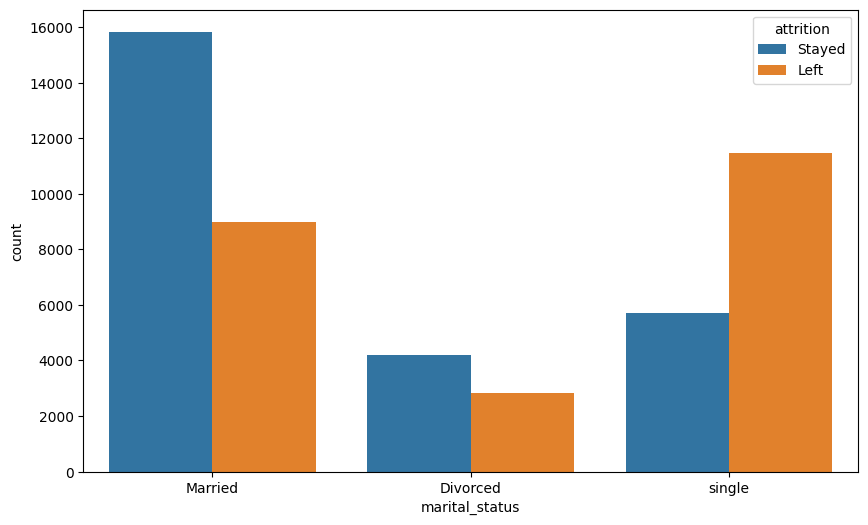

In [ ]:
#marital_status based on attrition
plt.figure(figsize=(10, 6))
sns.countplot(x='marital_status', hue='attrition', data=employee_data)

Marital status can have a varied effect on attrition depending on individual circumstances and potentially the stage of life. For example, "Single" employees might be more mobile and willing to relocate for new jobs compared to "Married" employees with family ties.

### remote_work

In [ ]:
#remote_work numbers
employee_data['remote_work'].value_counts()

,count
remote_work,
No,39707
Yes,9308


In [ ]:
#remote_work numbers based on attrition
employee_data.groupby('attrition')['remote_work'].value_counts()

attrition  remote_work
Left       No             20972
           Yes             2300
Stayed     No             18735
           Yes             7008
Name: count, dtype: int64

In [ ]:
#remote_work based on attrition
fig = px.pie(employee_data, names='remote_work', color_discrete_sequence=px.colors.qualitative.Bold)
fig


In [ ]:
#remote_work based on attrition
fig = px.histogram(employee_data, x='remote_work', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Antique)
fig

The effect of remote work on attrition can be mixed. For some, remote work decreases attrition by providing flexibility and improving work-life balance. For others, a lack of social connection or challenges with remote work environments might increase attrition. but in this data the people that do not work remotly are tented to leave more.

### employee_recognition

In [ ]:
#employee_recognition numbers
employee_data['employee_recognition'].value_counts()

,count
employee_recognition,
Low,19591
Medium,14800
High,12221
Very High,2403


In [ ]:
#employee_recognition numbers based on attrition
employee_data.groupby('attrition')['employee_recognition'].value_counts()

attrition  employee_recognition
Left       Low                      9372
           Medium                   7032
           High                     5768
           Very High                1100
Stayed     Low                     10219
           Medium                   7768
           High                     6453
           Very High                1303
Name: count, dtype: int64

In [ ]:
#employee_recognition based on attrition
fig = px.pie(employee_data, names='employee_recognition', color_discrete_sequence=px.colors.qualitative.Antique)
fig

In [ ]:
#employee_recognition based on attrition
fig = px.histogram(employee_data, x='employee_recognition', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Bold)
fig

The employee_recognition may not have a strong or clear effect on attrition in this dataset.but Lower employee recognition generally increases the likelihood of attrition.

### income_category

In [ ]:
#income_category numbers
employee_data['income_category'].value_counts()

,count
income_category,
Medium,35678
Low,8037
High,5300


In [ ]:
#income_category numbers based on attrition
employee_data.groupby('attrition')['income_category'].value_counts()

attrition  income_category
Left       Medium             16821
           Low                 3971
           High                2480
Stayed     Medium             18857
           Low                 4066
           High                2820
Name: count, dtype: int64

In [ ]:
#income_category based on attrition
fig = px.pie(employee_data, names='income_category', color_discrete_sequence=px.colors.qualitative.Bold)
fig

In [ ]:
#income_category based on attrition
fig = px.histogram(employee_data, x='income_category', color='attrition', barmode='group', nbins=20 ,color_discrete_sequence=px.colors.qualitative.Vivid)
fig

Being in a "Low" or "medium" income category significantly increases the likelihood of attrition.

### hiring_year

In [ ]:
#hiring_year numbers
employee_data['hiring_year'].value_counts().head(10)

,count
hiring_year,
2020,2018
2024,2016
2023,1993
2017,1981
2016,1958
2015,1958
2018,1938
2022,1936
2019,1934


In [ ]:
#hiring_year numbers based on attrition = left
employee_data.groupby('attrition')['hiring_year'].value_counts().loc['Left'].head(10)

,count
hiring_year,
2020,1097
2023,1080
2017,1076
2016,1063
2024,1055
2018,1031
2019,1015
2021,1014
2022,990


In [ ]:
#hiring_year numbers based on attrition = stayed
employee_data.groupby('attrition')['hiring_year'].value_counts().loc['Stayed'].head(10)

,count
hiring_year,
2015,1080
2014,1067
2013,964
2024,961
2022,946
2012,925
2020,921
2019,919
2023,913


In [ ]:
#hiring_year numbers based on attrition with the years that have biggest numbers of left employees
hiring_year_left_counts = employee_data[employee_data['attrition'] == 'Left']['hiring_year'].value_counts().head(10)

hiring_year_left_df = hiring_year_left_counts.reset_index()
hiring_year_left_df.columns = ['hiring_year', 'count']

fig = px.line(hiring_year_left_df, x='hiring_year', y='count',
              title='Top 10 Hiring Years with Most Employee Attrition')
fig


In [ ]:
#hiring_year numbers based on attrition with the years that have biggest numbers of stayed employees
hiring_year_stayed_counts = employee_data[employee_data['attrition'] == 'Stayed']['hiring_year'].value_counts().head(10)

hiring_year_stayed_df = hiring_year_stayed_counts.reset_index()
hiring_year_stayed_df.columns = ['hiring_year', 'count']

fig = px.line(hiring_year_stayed_df, x='hiring_year', y='count',
              title='Top 10 Hiring Years with Most Employee Stayed')
fig


In [ ]:
#coleration chart
numerical_cols = ["monthly_income", "years_at_company", "distance_from_home", "number_of_dependents", "age", "number_of_promotions"]
correlation_matrix = employee_data[numerical_cols].corr().round(3)

fig = px.imshow(correlation_matrix,
                text_auto=True,
                aspect="auto",
                title="Correlation Matrix of Numerical Columns",
                color_continuous_scale='RdBu')

fig.show()


*   A value close to 1 indicates a strong positive linear correlation.
*   A value close to -1 indicates a strong negative linear correlation.
*   A value close to 0 indicates a weak or no linear correlation.







## data reprocessing

In [ ]:
employee_data.head(3)

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,...,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,attrition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,Excellent,Medium,Average,2,...,22.0,Associate Degree,Married,0,Mid,No,Medium,Stayed,Medium,2006
1,64756,59,Female,4,Media,5534.0,Poor,High,Low,3,...,21.0,Master's Degree,Divorced,3,Mid,No,Low,Stayed,Medium,2021
2,30257,24,Female,10,Healthcare,8159.0,good,High,Low,0,...,11.0,Bachelor's Degree,Married,3,Mid,No,Low,Stayed,Medium,2015


In [ ]:
employee_data.describe()

,age,years_at_company,monthly_income,number_of_promotions,distance_from_home,number_of_dependents
count,49015.000000,49015.000000,49015.000000,49015.000000,49015.000000,49015.000000
mean,38.546180,15.746894,7332.264572,0.831847,49.947689,1.654596
std,12.069917,11.239476,2505.728701,0.994887,28.500870,1.584885
min,18.000000,1.000000,1516.000000,0.000000,1.000000,0.000000
25%,28.000000,7.000000,5654.000000,0.000000,25.000000,0.000000
50%,39.000000,13.000000,7338.000000,1.000000,50.000000,1.000000
75%,49.000000,23.000000,8870.000000,2.000000,75.000000,3.000000
max,59.000000,51.000000,50020.000000,4.000000,99.000000,15.000000


### handle outliers

In [ ]:
employee_data_2 = employee_data

### years_at_company

<Axes: xlabel='years_at_company'>

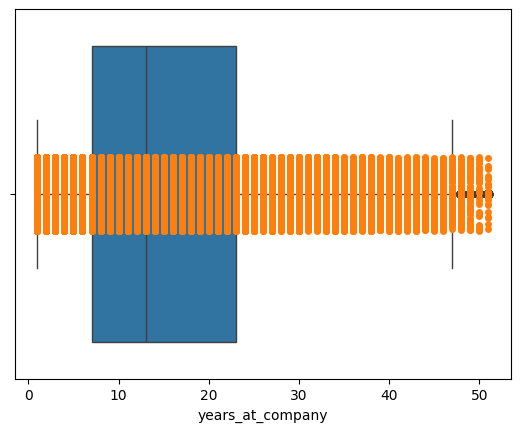

In [ ]:
sns.boxplot(data = employee_data_2 , x = 'years_at_company')
sns.stripplot(data = employee_data_2 , x = 'years_at_company')

In [ ]:
from datasist.structdata import detect_outliers
outlier_indices = detect_outliers(employee_data_2 , 0 , ['years_at_company'])

In [ ]:
employee_data_2.loc[outlier_indices, 'years_at_company']

,years_at_company
465,48
662,49
843,49
1373,48
1567,48
...,...
48373,48
48461,51
48654,49
49380,48


### monthly_income

<Axes: xlabel='monthly_income'>

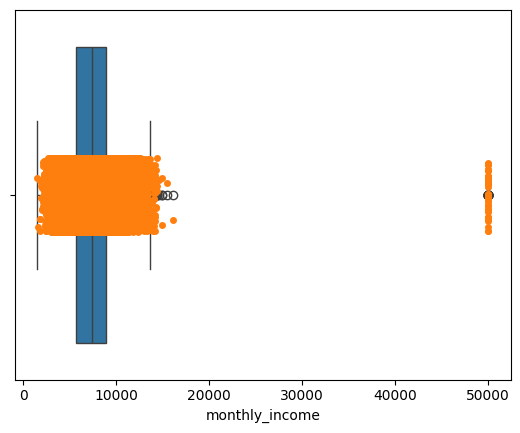

In [ ]:
sns.boxplot(data = employee_data_2 , x = 'monthly_income')
sns.stripplot(data = employee_data_2 , x = 'monthly_income')

In [ ]:
from datasist.structdata import detect_outliers
outlier_indices = detect_outliers(employee_data_2 , 0 , ['monthly_income'])

In [ ]:
employee_data_2.loc[outlier_indices, 'monthly_income']

,monthly_income
387,15495.0
477,50000.0
481,50000.0
545,50000.0
562,50000.0
...,...
43690,14137.0
43730,14103.0
47071,14924.0
47255,13728.0


### distance_from_home

<Axes: xlabel='distance_from_home'>

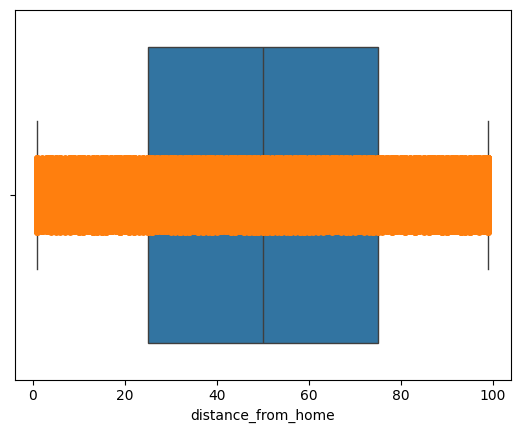

In [ ]:
sns.boxplot(data = employee_data_2 , x = 'distance_from_home')
sns.stripplot(data = employee_data_2 , x = 'distance_from_home')

In [ ]:
from datasist.structdata import detect_outliers
outlier_indices = detect_outliers(employee_data_2 , 0 , ['distance_from_home'])

In [ ]:
employee_data_2.loc[outlier_indices, 'distance_from_home']

,distance_from_home


### number_of_dependents

<Axes: xlabel='number_of_dependents'>

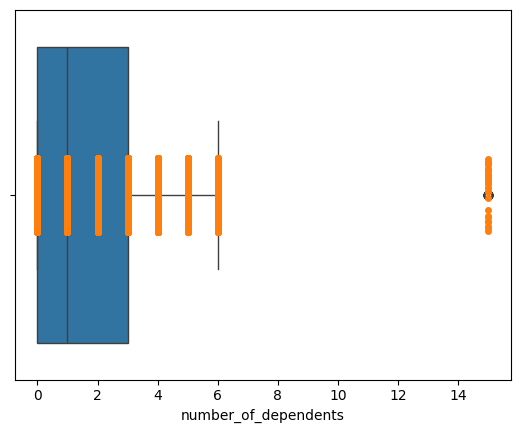

In [ ]:
sns.boxplot(data = employee_data_2 , x = 'number_of_dependents')
sns.stripplot(data = employee_data_2 , x = 'number_of_dependents')

In [ ]:
from datasist.structdata import detect_outliers
outlier_indices = detect_outliers(employee_data_2 , 0 , ['number_of_dependents'])

In [ ]:
employee_data_2.loc[outlier_indices, 'number_of_dependents']

,number_of_dependents
28990,15
28991,15
28997,15
29006,15
29015,15
29024,15
29028,15
29032,15
29050,15
29063,15


### number_of_promotions

<Axes: xlabel='number_of_promotions'>

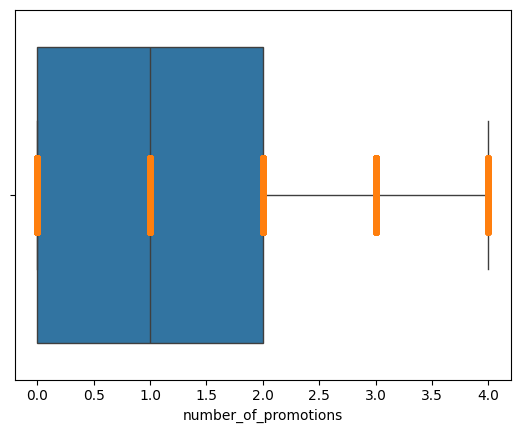

In [ ]:
sns.boxplot(data = employee_data_2 , x = 'number_of_promotions')
sns.stripplot(data = employee_data_2 , x = 'number_of_promotions')

In [ ]:
from datasist.structdata import detect_outliers
outlier_indices = detect_outliers(employee_data_2 , 0 , ['number_of_promotions'])

In [ ]:
employee_data_2.loc[outlier_indices, 'number_of_promotions']

,number_of_promotions


## output and input

In [ ]:
input = employee_data_2.drop('attrition', axis = 1)
output = employee_data_2[['attrition']]

In [ ]:
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,Excellent,Medium,Average,2,No,22.0,Associate Degree,Married,0,Mid,No,Medium,Medium,2006
1,64756,59,Female,4,Media,5534.0,Poor,High,Low,3,No,21.0,Master's Degree,Divorced,3,Mid,No,Low,Medium,2021
2,30257,24,Female,10,Healthcare,8159.0,good,High,Low,0,No,11.0,Bachelor's Degree,Married,3,Mid,No,Low,Medium,2015
3,65791,36,Female,7,Education,3989.0,good,High,High,1,No,27.0,High school,single,2,Mid,Yes,Medium,Low,2018
4,65026,56,Male,41,Education,4821.0,Fair,Very High,Average,0,Yes,71.0,High school,Divorced,0,Senior,No,Medium,Low,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,Fair,Low,Average,0,No,93.0,Bachelor's Degree,Married,4,Mid,No,Low,Medium,1999
49996,46500,20,Female,11,Technology,8143.0,Fair,High,Below Average,2,Yes,37.0,High school,Married,6,Senior,No,Low,Medium,2014
49997,63043,54,Male,45,Healthcare,8314.0,good,Low,High,2,No,84.0,Master's Degree,single,5,Entry,Yes,Medium,Medium,1980
49998,13770,22,Male,1,Technology,9005.0,good,High,Average,0,No,45.0,PHD,single,1,Entry,No,Very High,Medium,2024


In [ ]:
output

,attrition
0,Stayed
1,Stayed
2,Stayed
3,Stayed
4,Stayed
...,...
49995,Stayed
49996,Stayed
49997,Left
49998,Stayed


## handle categorical data

## input

In [ ]:
input["work-life_balance"].value_counts()

,count
work-life_balance,
good,18521
Fair,14890
Excellent,8831
Poor,6773


In [ ]:
encoded = {"Poor" : 1, "Fair" : 2, "good" : 3, "Excellent" : 4}
input['work-life_balance'] = input['work-life_balance'].map(encoded)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,Medium,Average,2,No,22.0,Associate Degree,Married,0,Mid,No,Medium,Medium,2006
1,64756,59,Female,4,Media,5534.0,1,High,Low,3,No,21.0,Master's Degree,Divorced,3,Mid,No,Low,Medium,2021
2,30257,24,Female,10,Healthcare,8159.0,3,High,Low,0,No,11.0,Bachelor's Degree,Married,3,Mid,No,Low,Medium,2015
3,65791,36,Female,7,Education,3989.0,3,High,High,1,No,27.0,High school,single,2,Mid,Yes,Medium,Low,2018
4,65026,56,Male,41,Education,4821.0,2,Very High,Average,0,Yes,71.0,High school,Divorced,0,Senior,No,Medium,Low,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,Low,Average,0,No,93.0,Bachelor's Degree,Married,4,Mid,No,Low,Medium,1999
49996,46500,20,Female,11,Technology,8143.0,2,High,Below Average,2,Yes,37.0,High school,Married,6,Senior,No,Low,Medium,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,Low,High,2,No,84.0,Master's Degree,single,5,Entry,Yes,Medium,Medium,1980
49998,13770,22,Male,1,Technology,9005.0,3,High,Average,0,No,45.0,PHD,single,1,Entry,No,Very High,Medium,2024


In [ ]:
input["job_satisfaction"].value_counts()

,count
job_satisfaction,
High,24462
Very High,9980
Medium,9755
Low,4818


In [ ]:
encoded_2 = {"Low" : 1, "Medium" : 2, "High" : 3, "Very High" : 4}
input['job_satisfaction'] = input['job_satisfaction'].map(encoded_2)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,Average,2,No,22.0,Associate Degree,Married,0,Mid,No,Medium,Medium,2006
1,64756,59,Female,4,Media,5534.0,1,3,Low,3,No,21.0,Master's Degree,Divorced,3,Mid,No,Low,Medium,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,Low,0,No,11.0,Bachelor's Degree,Married,3,Mid,No,Low,Medium,2015
3,65791,36,Female,7,Education,3989.0,3,3,High,1,No,27.0,High school,single,2,Mid,Yes,Medium,Low,2018
4,65026,56,Male,41,Education,4821.0,2,4,Average,0,Yes,71.0,High school,Divorced,0,Senior,No,Medium,Low,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,Average,0,No,93.0,Bachelor's Degree,Married,4,Mid,No,Low,Medium,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,Below Average,2,Yes,37.0,High school,Married,6,Senior,No,Low,Medium,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,High,2,No,84.0,Master's Degree,single,5,Entry,Yes,Medium,Medium,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,Average,0,No,45.0,PHD,single,1,Entry,No,Very High,Medium,2024


In [ ]:
input["performance_rating"].value_counts()

,count
performance_rating,
Average,29472
High,9770
Below Average,7349
Low,2424


In [ ]:
encoded_3 = {"Low" : 1, "Below Average" : 2, "Average" : 3, "High" : 4}
input['performance_rating'] = input['performance_rating'].map(encoded_3)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,No,22.0,Associate Degree,Married,0,Mid,No,Medium,Medium,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,No,21.0,Master's Degree,Divorced,3,Mid,No,Low,Medium,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,No,11.0,Bachelor's Degree,Married,3,Mid,No,Low,Medium,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,No,27.0,High school,single,2,Mid,Yes,Medium,Low,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,Yes,71.0,High school,Divorced,0,Senior,No,Medium,Low,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,3,0,No,93.0,Bachelor's Degree,Married,4,Mid,No,Low,Medium,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,2,2,Yes,37.0,High school,Married,6,Senior,No,Low,Medium,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,No,84.0,Master's Degree,single,5,Entry,Yes,Medium,Medium,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,3,0,No,45.0,PHD,single,1,Entry,No,Very High,Medium,2024


In [ ]:
input["job_level"].value_counts()

,count
job_level,
Entry,19573
Mid,19566
Senior,9876


In [ ]:
encoded_4 = {"Entry" : 1, "Mid" : 2, "Senior" : 3}
input['job_level'] = input['job_level'].map(encoded_4)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,No,22.0,Associate Degree,Married,0,2,No,Medium,Medium,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,No,21.0,Master's Degree,Divorced,3,2,No,Low,Medium,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,No,11.0,Bachelor's Degree,Married,3,2,No,Low,Medium,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,No,27.0,High school,single,2,2,Yes,Medium,Low,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,Yes,71.0,High school,Divorced,0,3,No,Medium,Low,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,3,0,No,93.0,Bachelor's Degree,Married,4,2,No,Low,Medium,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,2,2,Yes,37.0,High school,Married,6,3,No,Low,Medium,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,No,84.0,Master's Degree,single,5,1,Yes,Medium,Medium,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,3,0,No,45.0,PHD,single,1,1,No,Very High,Medium,2024


In [ ]:
input["employee_recognition"].value_counts()

,count
employee_recognition,
Low,19591
Medium,14800
High,12221
Very High,2403


In [ ]:
encoded_5 = {"Low" : 1, "Medium" : 2, "High" : 3, "Very High" : 4}
input['employee_recognition'] = input['employee_recognition'].map(encoded_5)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,No,22.0,Associate Degree,Married,0,2,No,2,Medium,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,No,21.0,Master's Degree,Divorced,3,2,No,1,Medium,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,No,11.0,Bachelor's Degree,Married,3,2,No,1,Medium,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,No,27.0,High school,single,2,2,Yes,2,Low,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,Yes,71.0,High school,Divorced,0,3,No,2,Low,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,3,0,No,93.0,Bachelor's Degree,Married,4,2,No,1,Medium,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,2,2,Yes,37.0,High school,Married,6,3,No,1,Medium,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,No,84.0,Master's Degree,single,5,1,Yes,2,Medium,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,3,0,No,45.0,PHD,single,1,1,No,4,Medium,2024


In [ ]:
input["income_category"].value_counts()

,count
income_category,
Medium,35678
Low,8037
High,5300


In [ ]:
encoded_6 = {"Low" : 1, "Medium" : 2, "High" : 3}
input['income_category'] = input['income_category'].map(encoded_6)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,No,22.0,Associate Degree,Married,0,2,No,2,2,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,No,21.0,Master's Degree,Divorced,3,2,No,1,2,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,No,11.0,Bachelor's Degree,Married,3,2,No,1,2,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,No,27.0,High school,single,2,2,Yes,2,1,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,Yes,71.0,High school,Divorced,0,3,No,2,1,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,3,0,No,93.0,Bachelor's Degree,Married,4,2,No,1,2,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,2,2,Yes,37.0,High school,Married,6,3,No,1,2,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,No,84.0,Master's Degree,single,5,1,Yes,2,2,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,3,0,No,45.0,PHD,single,1,1,No,4,2,2024


In [ ]:
input["education_level"].value_counts()

,count
education_level,
Bachelor's Degree,14584
Associate Degree,12277
Master's Degree,9970
High school,9653
PHD,2531


In [ ]:
encoded_7 = {"High school" : 1, "Bachelor's Degree" : 2, "Master's Degree" : 3, "Associate Degree" : 4 ,  "PHD" : 5}
input['education_level'] = input['education_level'].map(encoded_7)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,No,22.0,4,Married,0,2,No,2,2,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,No,21.0,3,Divorced,3,2,No,1,2,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,No,11.0,2,Married,3,2,No,1,2,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,No,27.0,1,single,2,2,Yes,2,1,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,Yes,71.0,1,Divorced,0,3,No,2,1,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,3,0,No,93.0,2,Married,4,2,No,1,2,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,2,2,Yes,37.0,1,Married,6,3,No,1,2,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,No,84.0,3,single,5,1,Yes,2,2,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,3,0,No,45.0,5,single,1,1,No,4,2,2024


In [ ]:
input["remote_work"].value_counts()

,count
remote_work,
No,39707
Yes,9308


In [ ]:
encoded_8 = {"No" : 0, "Yes" : 1}
input['remote_work'] = input['remote_work'].map(encoded_8)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,No,22.0,4,Married,0,2,0,2,2,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,No,21.0,3,Divorced,3,2,0,1,2,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,No,11.0,2,Married,3,2,0,1,2,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,No,27.0,1,single,2,2,1,2,1,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,Yes,71.0,1,Divorced,0,3,0,2,1,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,3,0,No,93.0,2,Married,4,2,0,1,2,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,2,2,Yes,37.0,1,Married,6,3,0,1,2,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,No,84.0,3,single,5,1,1,2,2,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,3,0,No,45.0,5,single,1,1,0,4,2,2024


In [ ]:
input["overtime"].value_counts()

,count
overtime,
No,33144
Yes,15871


In [ ]:
encoded_9 = {"No" : 0, "Yes" : 1}
input['overtime'] = input['overtime'].map(encoded_9)
input

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,0,22.0,4,Married,0,2,0,2,2,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,0,21.0,3,Divorced,3,2,0,1,2,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,0,11.0,2,Married,3,2,0,1,2,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,0,27.0,1,single,2,2,1,2,1,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,1,71.0,1,Divorced,0,3,0,2,1,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,67431,34,Female,26,Technology,8289.0,2,1,3,0,0,93.0,2,Married,4,2,0,1,2,1999
49996,46500,20,Female,11,Technology,8143.0,2,3,2,2,1,37.0,1,Married,6,3,0,1,2,2014
49997,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,0,84.0,3,single,5,1,1,2,2,1980
49998,13770,22,Male,1,Technology,9005.0,3,3,3,0,0,45.0,5,single,1,1,0,4,2,2024


In [ ]:
input_reset = input.reset_index(drop=True)
input_reset

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,marital_status,number_of_dependents,job_level,remote_work,employee_recognition,income_category,hiring_year
0,8410,31,Male,19,Education,5390.0,4,2,3,2,0,22.0,4,Married,0,2,0,2,2,2006
1,64756,59,Female,4,Media,5534.0,1,3,1,3,0,21.0,3,Divorced,3,2,0,1,2,2021
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,0,11.0,2,Married,3,2,0,1,2,2015
3,65791,36,Female,7,Education,3989.0,3,3,4,1,0,27.0,1,single,2,2,1,2,1,2018
4,65026,56,Male,41,Education,4821.0,2,4,3,0,1,71.0,1,Divorced,0,3,0,2,1,1984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49010,67431,34,Female,26,Technology,8289.0,2,1,3,0,0,93.0,2,Married,4,2,0,1,2,1999
49011,46500,20,Female,11,Technology,8143.0,2,3,2,2,1,37.0,1,Married,6,3,0,1,2,2014
49012,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,0,84.0,3,single,5,1,1,2,2,1980
49013,13770,22,Male,1,Technology,9005.0,3,3,3,0,0,45.0,5,single,1,1,0,4,2,2024


In [ ]:
from sklearn.preprocessing import OneHotEncoder
onehot = OneHotEncoder(drop='first')
onehot.fit(input_reset[['gender', 'job_role', "marital_status"]])

OneHotEncoder(drop='first')

In [ ]:
one_hot_df = onehot.transform(input_reset[['gender', 'job_role', "marital_status"]])
one_hot_df.toarray()

array([[1., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 1., 0.],
       ...,
       [1., 0., 1., ..., 0., 0., 1.],
       [1., 0., 0., ..., 1., 0., 1.],
       [1., 0., 1., ..., 0., 1., 0.]])

In [ ]:
input_encoded = pd.DataFrame(one_hot_df.toarray(), columns=onehot.get_feature_names_out())
input_encoded

,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
49010,0.0,0.0,0.0,0.0,1.0,1.0,0.0
49011,0.0,0.0,0.0,0.0,1.0,1.0,0.0
49012,1.0,0.0,1.0,0.0,0.0,0.0,1.0
49013,1.0,0.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
input_final = pd.concat([input_reset , input_encoded] , axis = 1)
input_final

,employee_id,age,gender,years_at_company,job_role,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,...,employee_recognition,income_category,hiring_year,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
0,8410,31,Male,19,Education,5390.0,4,2,3,2,...,2,2,2006,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,64756,59,Female,4,Media,5534.0,1,3,1,3,...,1,2,2021,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,30257,24,Female,10,Healthcare,8159.0,3,3,1,0,...,1,2,2015,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,65791,36,Female,7,Education,3989.0,3,3,4,1,...,2,1,2018,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,65026,56,Male,41,Education,4821.0,2,4,3,0,...,2,1,1984,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49010,67431,34,Female,26,Technology,8289.0,2,1,3,0,...,1,2,1999,0.0,0.0,0.0,0.0,1.0,1.0,0.0
49011,46500,20,Female,11,Technology,8143.0,2,3,2,2,...,1,2,2014,0.0,0.0,0.0,0.0,1.0,1.0,0.0
49012,63043,54,Male,45,Healthcare,8314.0,3,1,4,2,...,2,2,1980,1.0,0.0,1.0,0.0,0.0,0.0,1.0
49013,13770,22,Male,1,Technology,9005.0,3,3,3,0,...,4,2,2024,1.0,0.0,0.0,0.0,1.0,0.0,1.0


In [ ]:
input_final.drop(['employee_id','gender', 'job_role', 'marital_status' ,'hiring_year'] ,axis = 1, inplace = True )
input_final

,age,years_at_company,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,...,remote_work,employee_recognition,income_category,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
0,31,19,5390.0,4,2,3,2,0,22.0,4,...,0,2,2,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,59,4,5534.0,1,3,1,3,0,21.0,3,...,0,1,2,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,24,10,8159.0,3,3,1,0,0,11.0,2,...,0,1,2,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,36,7,3989.0,3,3,4,1,0,27.0,1,...,1,2,1,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,56,41,4821.0,2,4,3,0,1,71.0,1,...,0,2,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49010,34,26,8289.0,2,1,3,0,0,93.0,2,...,0,1,2,0.0,0.0,0.0,0.0,1.0,1.0,0.0
49011,20,11,8143.0,2,3,2,2,1,37.0,1,...,0,1,2,0.0,0.0,0.0,0.0,1.0,1.0,0.0
49012,54,45,8314.0,3,1,4,2,0,84.0,3,...,1,2,2,1.0,0.0,1.0,0.0,0.0,0.0,1.0
49013,22,1,9005.0,3,3,3,0,0,45.0,5,...,0,4,2,1.0,0.0,0.0,0.0,1.0,0.0,1.0


## output

In [ ]:
output

,attrition
0,Stayed
1,Stayed
2,Stayed
3,Stayed
4,Stayed
...,...
49995,Stayed
49996,Stayed
49997,Left
49998,Stayed


In [ ]:
output["attrition"].value_counts()

,count
attrition,
Stayed,25743
Left,23272


In [ ]:
encoded_10 = {"Left" : 0, "Stayed" : 1}
output['attrition'] = output['attrition'].map(encoded_10)
output

<ipython-input-171-c0f365d0eae8>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,attrition
0,1
1,1
2,1
3,1
4,1
...,...
49995,1
49996,1
49997,0
49998,1


In [ ]:
output_final = output.reset_index(drop=True)
output_final

,attrition
0,1
1,1
2,1
3,1
4,1
...,...
49010,1
49011,1
49012,0
49013,1


## train and test

In [ ]:
from sklearn.model_selection import train_test_split
input_final_train, input_final_test, output_final_train, output_final_test = train_test_split(input_final, output_final, test_size=0.2, random_state=42 , stratify=output_final)


In [ ]:
input_final_train

,age,years_at_company,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,...,remote_work,employee_recognition,income_category,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
10786,35,20,7463.0,2,3,2,0,1,57.0,4,...,0,2,2,1.0,0.0,0.0,0.0,1.0,1.0,0.0
1836,22,10,9249.0,2,4,4,0,0,42.0,2,...,1,1,2,0.0,0.0,1.0,0.0,0.0,0.0,1.0
48616,33,2,8640.0,4,3,1,2,0,81.0,4,...,0,3,2,1.0,0.0,0.0,0.0,1.0,1.0,0.0
8041,32,12,9446.0,2,4,1,1,0,61.0,2,...,0,1,2,0.0,0.0,0.0,0.0,1.0,1.0,0.0
20006,55,8,8048.0,3,3,3,0,1,50.0,4,...,0,1,2,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11933,19,8,6495.0,2,2,3,1,0,12.0,2,...,1,3,2,0.0,0.0,0.0,1.0,0.0,1.0,0.0
27799,19,6,8897.0,2,3,3,3,0,58.0,1,...,0,2,2,1.0,0.0,1.0,0.0,0.0,1.0,0.0
44991,58,34,5868.0,3,3,3,1,1,54.0,1,...,0,1,2,1.0,0.0,0.0,1.0,0.0,0.0,1.0
4971,46,4,6895.0,3,3,3,0,1,95.0,2,...,0,2,2,1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
input_final_test

,age,years_at_company,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,...,remote_work,employee_recognition,income_category,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
1441,39,25,9210.0,3,3,3,0,1,18.0,1,...,0,1,2,1.0,0.0,0.0,0.0,1.0,0.0,1.0
11160,38,3,9694.0,1,3,4,2,0,89.0,3,...,0,3,2,1.0,0.0,0.0,0.0,1.0,0.0,1.0
44783,53,31,10371.0,3,2,3,2,1,40.0,4,...,0,1,3,1.0,0.0,0.0,0.0,1.0,0.0,1.0
23417,26,6,6939.0,2,3,3,0,0,10.0,4,...,0,3,2,1.0,0.0,1.0,0.0,0.0,0.0,1.0
25307,32,14,6816.0,1,3,3,0,0,2.0,4,...,0,3,2,1.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11130,43,20,7088.0,3,2,3,1,1,13.0,2,...,0,1,2,0.0,0.0,1.0,0.0,0.0,0.0,1.0
28171,38,2,4942.0,1,3,2,0,1,6.0,4,...,0,2,1,1.0,0.0,0.0,0.0,0.0,1.0,0.0
38579,31,5,8692.0,3,4,2,1,0,4.0,3,...,1,1,2,1.0,0.0,0.0,0.0,1.0,0.0,1.0
11016,40,27,5454.0,3,2,3,0,1,29.0,2,...,1,2,2,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
output_final_train

,attrition
10786,0
1836,1
48616,0
8041,0
20006,0
...,...
11933,0
27799,1
44991,1
4971,0


In [ ]:
output_final_test

,attrition
1441,0
11160,0
44783,1
23417,1
25307,0
...,...
11130,0
28171,0
38579,1
11016,1


## scaling

In [ ]:
from sklearn.preprocessing import RobustScaler
robust_scaler = RobustScaler()
input_train_r_scaled = robust_scaler.fit_transform(input_final_train)

In [ ]:
input_final_train_r_scaled = pd.DataFrame(input_train_r_scaled, columns=input_final_train.columns)
input_final_train_r_scaled

,age,years_at_company,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,...,remote_work,employee_recognition,income_category,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
0,-0.190476,0.4375,0.038641,-1.0,0.0,-1.0,-0.5,1.0,0.14,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.809524,-0.1875,0.595201,-1.0,1.0,1.0,-0.5,0.0,-0.16,-0.5,...,1.0,-0.5,0.0,-1.0,0.0,1.0,0.0,0.0,-1.0,1.0
2,-0.285714,-0.6875,0.405422,1.0,0.0,-2.0,0.5,0.0,0.62,0.5,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,-0.333333,-0.0625,0.656591,-1.0,1.0,-2.0,0.0,0.0,0.22,-0.5,...,0.0,-0.5,0.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.761905,-0.3125,0.220941,0.0,0.0,0.0,-0.5,1.0,0.00,0.5,...,0.0,-0.5,0.0,-1.0,0.0,1.0,0.0,0.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39207,-0.952381,-0.3125,-0.263010,-1.0,-1.0,0.0,0.0,0.0,-0.76,-0.5,...,1.0,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0
39208,-0.952381,-0.4375,0.485510,-1.0,0.0,0.0,1.0,0.0,0.16,-1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
39209,0.904762,1.3125,-0.458398,0.0,0.0,0.0,0.0,1.0,0.08,-1.0,...,0.0,-0.5,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1.0
39210,0.333333,-0.5625,-0.138361,0.0,0.0,0.0,-0.5,1.0,0.90,-0.5,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
input_test_r_scaled = robust_scaler.transform(input_final_test)

In [ ]:
input_final_test_r_scaled = pd.DataFrame(input_test_r_scaled, columns=input_final_test.columns)
input_final_test_r_scaled

,age,years_at_company,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,...,remote_work,employee_recognition,income_category,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
0,0.000000,0.7500,0.583048,0.0,0.0,0.0,-0.5,1.0,-0.64,-1.0,...,0.0,-0.5,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,1.0
1,-0.047619,-0.6250,0.733873,-2.0,0.0,1.0,0.5,0.0,0.78,0.0,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,1.0
2,0.666667,1.1250,0.944843,0.0,-1.0,0.0,0.5,1.0,-0.20,0.5,...,0.0,-0.5,1.0,0.0,0.0,0.0,0.0,1.0,-1.0,1.0
3,-0.619048,-0.4375,-0.124649,-1.0,0.0,0.0,-0.5,0.0,-0.80,0.5,...,0.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0,-1.0,1.0
4,-0.333333,0.0625,-0.162979,-2.0,0.0,0.0,-0.5,0.0,-0.96,0.5,...,0.0,0.5,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9798,0.190476,0.4375,-0.078218,0.0,-1.0,0.0,0.0,1.0,-0.74,-0.5,...,0.0,-0.5,0.0,-1.0,0.0,1.0,0.0,0.0,-1.0,1.0
9799,-0.047619,-0.6875,-0.746962,-2.0,0.0,-1.0,-0.5,1.0,-0.88,0.5,...,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9800,-0.380952,-0.5000,0.421627,0.0,1.0,-1.0,0.0,0.0,-0.92,0.0,...,1.0,-0.5,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,1.0
9801,0.047619,0.8750,-0.587410,0.0,-1.0,0.0,-0.5,1.0,-0.42,-0.5,...,1.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,1.0


## handle_impalance_data

In [ ]:
input_final_train_r_scaled

,age,years_at_company,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,...,remote_work,employee_recognition,income_category,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
0,-0.190476,0.4375,0.038641,-1.0,0.0,-1.0,-0.5,1.0,0.14,0.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.809524,-0.1875,0.595201,-1.0,1.0,1.0,-0.5,0.0,-0.16,-0.5,...,1.0,-0.5,0.0,-1.0,0.0,1.0,0.0,0.0,-1.0,1.0
2,-0.285714,-0.6875,0.405422,1.0,0.0,-2.0,0.5,0.0,0.62,0.5,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,-0.333333,-0.0625,0.656591,-1.0,1.0,-2.0,0.0,0.0,0.22,-0.5,...,0.0,-0.5,0.0,-1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.761905,-0.3125,0.220941,0.0,0.0,0.0,-0.5,1.0,0.00,0.5,...,0.0,-0.5,0.0,-1.0,0.0,1.0,0.0,0.0,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39207,-0.952381,-0.3125,-0.263010,-1.0,-1.0,0.0,0.0,0.0,-0.76,-0.5,...,1.0,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0,0.0
39208,-0.952381,-0.4375,0.485510,-1.0,0.0,0.0,1.0,0.0,0.16,-1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
39209,0.904762,1.3125,-0.458398,0.0,0.0,0.0,0.0,1.0,0.08,-1.0,...,0.0,-0.5,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,1.0
39210,0.333333,-0.5625,-0.138361,0.0,0.0,0.0,-0.5,1.0,0.90,-0.5,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
output_final_train

,attrition
10786,0
1836,1
48616,0
8041,0
20006,0
...,...
11933,0
27799,1
44991,1
4971,0


In [ ]:
output_final_train.value_counts()

,count
attrition,
1,20594
0,18618


In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
input_final_train_r_scaled_smote, output_final_train_smote = smote.fit_resample(input_final_train_r_scaled, output_final_train)

In [ ]:
output_final_train_smote.value_counts()

,count
attrition,
0,20594
1,20594


In [ ]:
input_final_train_r_scaled_smote = pd.DataFrame(input_final_train_r_scaled_smote, columns=input_final_train_r_scaled.columns)
input_final_train_r_scaled_smote

,age,years_at_company,monthly_income,work-life_balance,job_satisfaction,performance_rating,number_of_promotions,overtime,distance_from_home,education_level,...,remote_work,employee_recognition,income_category,gender_Male,job_role_Finance,job_role_Healthcare,job_role_Media,job_role_Technology,marital_status_Married,marital_status_single
0,-0.190476,0.437500,0.038641,-1.000000,0.0,-1.0,-0.500000,1.0,0.140000,0.500000,...,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,1.0,0.0,0.000000
1,-0.809524,-0.187500,0.595201,-1.000000,1.0,1.0,-0.500000,0.0,-0.160000,-0.500000,...,1.0,-0.500000,0.000000,-1.000000,0.0,1.0,0.0,0.0,-1.0,1.000000
2,-0.285714,-0.687500,0.405422,1.000000,0.0,-2.0,0.500000,0.0,0.620000,0.500000,...,0.0,0.500000,0.000000,0.000000,0.0,0.0,0.0,1.0,0.0,0.000000
3,-0.333333,-0.062500,0.656591,-1.000000,1.0,-2.0,0.000000,0.0,0.220000,-0.500000,...,0.0,-0.500000,0.000000,-1.000000,0.0,0.0,0.0,1.0,0.0,0.000000
4,0.761905,-0.312500,0.220941,0.000000,0.0,0.0,-0.500000,1.0,0.000000,0.500000,...,0.0,-0.500000,0.000000,-1.000000,0.0,1.0,0.0,0.0,-1.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,0.364841,1.173089,0.334739,0.000000,0.0,0.0,-0.500000,1.0,0.556592,0.500000,...,0.0,0.000000,0.000000,-1.000000,0.0,1.0,0.0,0.0,0.0,0.000000
41184,-0.295776,0.578322,0.585159,0.000000,1.0,1.0,-0.500000,1.0,0.738033,-0.105648,...,0.0,-0.500000,0.000000,0.000000,0.0,1.0,0.0,0.0,-1.0,1.000000
41185,0.491798,1.045146,0.412936,-2.000000,-1.0,0.0,0.336116,0.0,0.513779,-1.000000,...,0.0,-0.172233,0.000000,-0.672233,0.0,1.0,0.0,0.0,-1.0,0.327767
41186,-0.490276,-0.437500,0.936586,-0.370421,-1.0,1.0,-0.314790,0.0,0.449661,0.500000,...,0.0,0.500000,0.629579,0.000000,1.0,0.0,0.0,0.0,-1.0,1.000000
